In [1]:
import pandas as pd
import sklearn 
import scipy
from sklearn import linear_model as lm
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cross_validation import KFold, train_test_split, cross_val_score, StratifiedKFold, LabelKFold, ShuffleSplit
from sklearn.metrics import roc_auc_score
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from mhcflurry.amino_acid import common_amino_acids
from mhcflurry import dataset
from mhcflurry.dataset import Dataset
import matplotlib.pyplot as plt 
% matplotlib inline
import numpy as np
import math 
from mhcflurry import peptide_encoding, amino_acid
import statsmodels.api as sm
from keras import models, layers, optimizers
from keras.optimizers import Adam 
from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding, LSTM, Reshape, Input, merge, MaxPooling1D, GlobalAveragePooling1D, Convolution1D, AveragePooling1D, Activation, Flatten
from keras.preprocessing import sequence
from keras.models import Model
from keras.engine import topology
import seaborn as sns
from keras.layers.core import Lambda
from keras import backend as K
K.set_image_dim_ordering('tf')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
Using TensorFlow backend.


In [2]:
K.image_dim_ordering()

'tf'

In [3]:
ds = Dataset.from_csv("bdata.2009.mhci.public.1.txt")
ds_h = ds.slice(ds.alleles == 'HLA-A0201')

In [4]:
df = pd.read_table("bdata.2009.mhci.public.1.txt")

df['log_meas']=1-np.log(df['meas'])/math.log(50000)
df['peptide_length'] = df['sequence'].str.len()


max_len=df['sequence'].str.len().max()
n_peptides = df['sequence'].count()

def amino_acid_hotshot_encoding(s):
    return common_amino_acids.hotshot_encoding([s],len(s)).flatten().astype(int)
df['hotshot_encoded_peptides'] = df.sequence.apply(lambda seq: amino_acid_hotshot_encoding(seq))

def amino_acid_index_encoding(s, maxlen):
    a = 1+common_amino_acids.index_encoding([s],len(s)).flatten()
    return np.concatenate([a, np.zeros(maxlen-len(a),dtype=int)])
df['index_encoded_peptides'] = df.sequence.apply(lambda seq: amino_acid_index_encoding(seq, max_len))

def new_index_encoding(x):
    y = np.zeros(len(x))
    for i in range(len(x)):
        if x[i] != 0: 
            y[i] = x[i]+i*20
    return y

df['new_index_encoding'] = df.index_encoded_peptides.apply(lambda seq: new_index_encoding(seq))    
def measured_affinity_less_than(Y,k):
    IC50 = 50000**(1-Y)
    return (IC50 < k).astype(int) 

def affinity_label(Y):
    return measured_affinity_less_than(Y,50) + measured_affinity_less_than(Y,500) + measured_affinity_less_than(Y,5000) + measured_affinity_less_than(Y,50000)

df['affinity_label'] = affinity_label(df['log_meas'])
df_h = df[df['mhc']=='HLA-A-0201'][['hotshot_encoded_peptides','index_encoded_peptides','log_meas','peptide_length','new_index_encoding']]
X = np.array(list(df_h['index_encoded_peptides']))
X_new = np.array(list(df_h['new_index_encoding']))
y = np.array(list(df_h['log_meas']))
y[y<0]=0

In [5]:
def regroup_together(affinities, weights , original_indices):
    affinities = affinities.ravel()
    weights = weights.ravel()
    
    assert affinities.shape == weights.shape, "%s should be %s" % (affinities.shape, weights.shape)
    assert affinities.shape == original_indices.shape
    assert len(affinities) == len(affinities.ravel())
    
    weighted_affinities = (affinities * weights)
    index_set = set(original_indices)
    n_indices = len(index_set)
    result_order = {original_index: i for (i, original_index) in enumerate(sorted(index_set))}
    result = np.zeros(n_indices)
    for i, x in enumerate(weighted_affinities):
        result_idx = result_order[original_indices[i]]
        result[result_idx] += x
    return result

def slicing(dataset, index, i):
    return dataset.slice(index).kmer_index_encoding()[i]

def label_transform(array):
    result = 1-np.log(array)/math.log(50000)
    result[result<0]=0
    return result

def index_to_hotshot_encoding(index_encoded_nine_mer):
    result = np.zeros((9,21))
    for position, amino_acid in enumerate(index_encoded_nine_mer):
        result[position][amino_acid]= 1
    return result.flatten()

def real_labels(dataset,index):
    
    y = label_transform(slicing(dataset,index,1))
    weights = slicing(dataset,index,2)
    original_indices = slicing(dataset,index,3)
    
    return regroup_together(y, weights , original_indices)

def fit(model,dataset,index, neural_network = False, hotshot = False): # to be left out or modified 
    
    X = slicing(dataset,index,0)
    
    if (hotshot == True):
        X = np.apply_along_axis(index_to_hotshot_encoding, 1, X)
        
    y = label_transform(slicing(dataset,index,1))
    weights = slicing(dataset,index,2)
    
    if (neural_network == True):
        model.fit(X, y, sample_weight = weights, batch_size = 16, nb_epoch = 1)
    else: 
        model.fit(X, y, sample_weight = weights)
        
        
def fit_new(model,dataset,index, neural_network = False):
    X = slicing(dataset,index,0)
    y = label_transform(slicing(dataset,index,1))
    weights = slicing(dataset,index,2)
    X_new = np.apply_along_axis(new_index_encoding, 1, X) 
    
    if (neural_network == True):
        model.fit(X_new, y, sample_weight = weights, batch_size = 16, nb_epoch = 1)
    else: 
        model.fit(X_new, y, sample_weight = weights)
        
        
def predict(model, dataset, index, hotshot = False):
    
    X = slicing(dataset,index,0)
    
    if (hotshot == True):
        X = np.apply_along_axis(index_to_hotshot_encoding, 1, X)
        
    weights = slicing(dataset,index,2)
    original_indices = slicing(dataset,index,3)
    
    return regroup_together(model.predict(X), weights , original_indices)

def AUC(model, dataset, index, hotshot = False):
        
    real_affinity = measured_affinity_less_than(real_labels(dataset,index),500)
    predicted_affinity = predict(model, dataset, index, hotshot = hotshot)
    
    return roc_auc_score(real_affinity, predicted_affinity)

def AUC_simple(model, features, labels, index):
    real_affinity = measured_affinity_less_than(labels[index],500)
    predicted_affinity = model.predict(features[index])
    
    return roc_auc_score(real_affinity, predicted_affinity)

def AUC_simple_average(model_1, model_2, features, labels, index):
    real_affinity = measured_affinity_less_than(labels[index],500)
    predicted_affinity_1 = model_1.predict(features[index])
    predicted_affinity_2 = model_2.predict(features[index])
    predicted_affinity = 0.5* predicted_affinity_1 + 0.5* predicted_affinity_2
    
    return roc_auc_score(real_affinity, predicted_affinity)
def split_by_length(X,index,length=9):
    length_idx = np.array([i for i in index if (np.count_nonzero(X[i])==length)])
    non_length_idx = np.array([i for i in index if (np.count_nonzero(X[i])!=length)])
    return index, length_idx, non_length_idx
from numpy import ma 

array_test = np.array([[1,2,3,4],[5,6,7,8],[9,10,11,12]])
position = [[1,0,0,0], [0,1,0,0], [0,0,1,0]]
values = 0
mx = ma.masked_array(array_test, mask=position, fill_value =0)
print(mx)
def sum_character_deletion(model,array,length): 
    result = np.zeros(len(array))
    for i in range(length):
        position_matrix = np.zeros((len(array),length))
        position_matrix[:,i] = 1 
        mx = ma.masked_array(array, mask=position_matrix)
        result = result + model.predict(mx)
        
    return result / length
        
def random_dropout_prediction_by_lentgh(model,array,length):
    array_of_lengths = np.apply_along_axis(np.count_nonzero,1,array)
    #print("array shape", array.shape, "array of lengths shape", array_of_lengths.shape)
    bool_array = (array_of_lengths == length)
    #print("bool_array shape", bool_array.shape)
    result = np.zeros(len(array))
    #print("result shape", result.shape)
    for i in range(length):
        position_matrix = np.zeros(array.shape)
        position_matrix[:,i] = 1 
        print("array shape", array.shape, "position_matrix shape", position_matrix.shape)
        mx = ma.masked_array(array, mask=position_matrix)
        result[bool_array] = result[bool_array] + model.predict(mx)
    
    #print("result[bool_array] shape", result[bool_array].shape, "model prediction shape", model.predict(array[bool_array]).shape)
    return result/length

def random_dropout_array_prediction(model,array):
    array_of_lengths = np.apply_along_axis(np.count_nonzero,1,array)
    result = np.zeros(len(array))
    for length in np.unique(array_of_lengths):
        result = result + random_dropout_prediction_by_lentgh(model,array,length)
    return result

def AUC_random_dropout(model, features, labels, index):
    real_affinity = measured_affinity_less_than(labels[index],500)
    predicted_affinity = random_dropout_array_prediction(model, features[index])
    
    return roc_auc_score(real_affinity, predicted_affinity)

[[-- 2 3 4]
 [5 -- 7 8]
 [9 10 -- 12]]


# A - shallow-net vs convnet

In [6]:
folds = 3
batch_size_nn = 16
batch_size_lstm = 16
hidden = 50
dropout_probability = 0.25

n_epochs = 40
epoch = 0


lstm_26_W_aucs = np.zeros((6, folds,n_epochs))

nn_aucs = np.zeros((6, folds,n_epochs))
conv_net_3_aucs = np.zeros((6, folds,n_epochs))
conv_net_5_aucs = np.zeros((6, folds,n_epochs))

for i, (train_idx, test_idx) in enumerate(KFold(len(X),folds, shuffle=True)):
    
    list_index = split_by_length(X,train_idx,length=9)+split_by_length(X,test_idx,length=9)
    
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 3, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_3 = Model(input = sequence, output = output)
    
    conv_net_3.compile(optimizer = 'adam', loss='mean_squared_error')
    
    
    #nn
    nn = Sequential()
    nn.add(Embedding(input_dim = 21, input_length =9, output_dim= 32))
    nn.add(Flatten())
    nn.add(Dense(10, init='glorot_uniform', activation='tanh'))
    nn.add(Dropout(dropout_probability))
    nn.add(Dense(1, init='glorot_uniform', activation='sigmoid'))
    
    nn.compile(optimizer = 'adam', loss='mean_squared_error')
    
    
    for epoch in range(n_epochs):
        
        conv_net_3.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_3_aucs[k][i][epoch] = AUC_simple(conv_net_3, X, y  , index)    
            
        fit(nn,ds_h, train_idx, neural_network = True, hotshot = False)
        for k, index in enumerate(list_index):
            nn_aucs[k][i][epoch] = AUC(nn, ds_h, index)    
 
    
        
        print("test AUC allmers:", conv_net_3_aucs[3][i][epoch], nn_aucs[3][i][epoch] ,  i, epoch)  
        print("test AUC 9 mers:",  conv_net_3_aucs[4][i][epoch], nn_aucs[4][i][epoch],  i, epoch)  
        print("test AUC non 9 mers:", conv_net_3_aucs[5][i][epoch], nn_aucs[5][i][epoch], i, epoch)  

Epoch 1/1
6376/6376 [==============================] - 3s - loss: 0.0495       

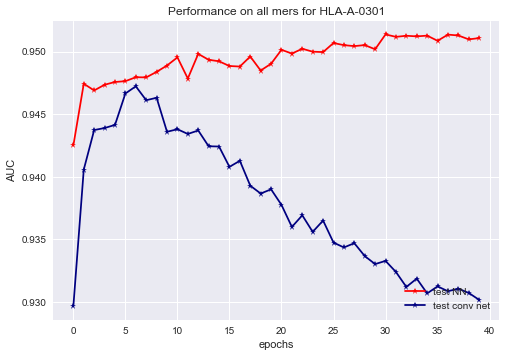

In [7]:
plt.plot( np.arange(0,n_epochs,1), nn_aucs[3,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test NN ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[3,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0301")
plt.legend(loc=4)

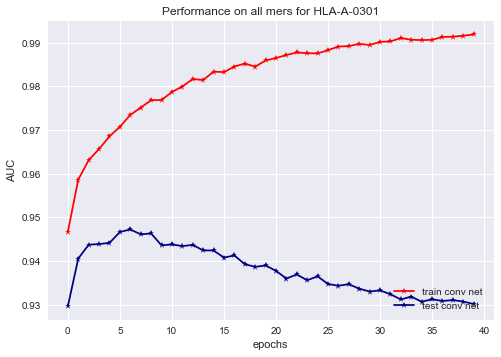

In [11]:
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[1,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[3,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0301")
plt.legend(loc=4)

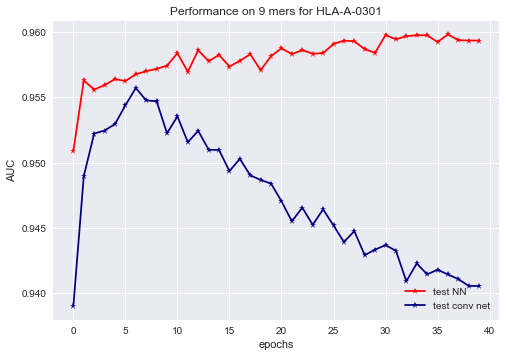

In [9]:
plt.plot( np.arange(0,n_epochs,1), nn_aucs[4,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test NN ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[4,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on 9 mers for HLA-A-0301")
plt.legend(loc=4)

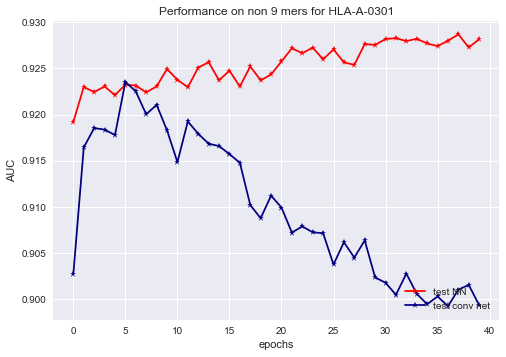

In [10]:
plt.plot( np.arange(0,n_epochs,1), nn_aucs[5,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test NN ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[5,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on non 9 mers for HLA-A-0301")
plt.legend(loc=4)

now let us look at test vs train performance for the convnet solely. 

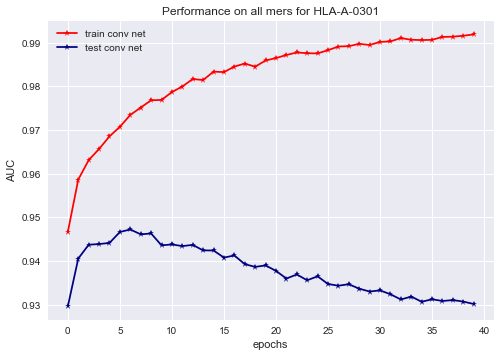

In [12]:
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[1,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[3,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0301")
plt.legend(loc=2)

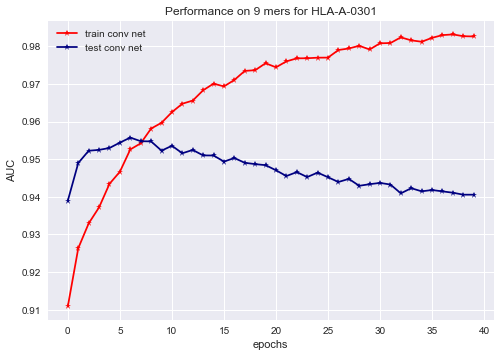

In [13]:
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[2,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[4,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on 9 mers for HLA-A-0301")
plt.legend(loc=2)

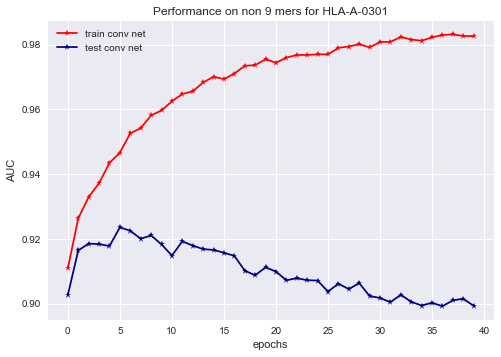

In [14]:
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[2,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net ")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[5,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net")
plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on non 9 mers for HLA-A-0301")
plt.legend(loc=2)

we can see that we are clearly overfitting (across 9 mers as well as non 9 mers). Now let us think about strategies how to reduce overfitting. The effective capacity is constrained by three factors:

    (1) the representational capacity of the model
    (2) the ability of the learning algorithm to successfully minimize the cost function used to train the model 
    (3) the degree to which the cost function and training procedure regularize the model 

# B- comparison between conv nets

in the following experiment, we denote:

    conv net 1 -> conv net with filter lengths 1,2,3,4 and 'poool_length = 3' 
    conv net 2 -> conv net with filter lengths 1,2,3,4 and 'pool_length = 4'
    conv net 3 -> conv net with filter lengths 1,2,4,8 and 'pool_length = 3' 


In [15]:
folds = 3
batch_size_nn = 16
batch_size_lstm = 16
hidden = 50
dropout_probability = 0.25

n_epochs = 40
epoch = 0



conv_net_1_aucs = np.zeros((6, folds,n_epochs))
conv_net_2_aucs = np.zeros((6, folds,n_epochs))
conv_net_3_aucs = np.zeros((6, folds,n_epochs))

for i, (train_idx, test_idx) in enumerate(KFold(len(X),folds, shuffle=True)):
    
    list_index = split_by_length(X,train_idx,length=9)+split_by_length(X,test_idx,length=9)
    
    
    # CONV NET POOL,FILTER=(3,(1,2,3,4))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 3, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_1 = Model(input = sequence, output = output)
    
    conv_net_1.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(4,(1,2,3,4))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=4, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=4, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=4, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 3, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=4, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_2 = Model(input = sequence, output = output)
    
    conv_net_2.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_3 = Model(input = sequence, output = output)
    
    conv_net_3.compile(optimizer = 'adam', loss='mean_squared_error')
    
    
    for epoch in range(n_epochs):
        
        
        conv_net_1.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_1_aucs[k][i][epoch] = AUC_simple(conv_net_1, X, y  , index)    
        
        conv_net_2.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_2_aucs[k][i][epoch] = AUC_simple(conv_net_2, X, y  , index)    
        
        conv_net_3.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_3_aucs[k][i][epoch] = AUC_simple(conv_net_3, X, y  , index)    
            
           
 
    
        
        print("test AUC allmers:", conv_net_1_aucs[3][i][epoch], conv_net_2_aucs[3][i][epoch], conv_net_3_aucs[3][i][epoch], i, epoch)  
        print("test AUC 9 mers:",  conv_net_1_aucs[4][i][epoch], conv_net_2_aucs[4][i][epoch], conv_net_3_aucs[4][i][epoch], i, epoch)  
        print("test AUC non 9 mers:", conv_net_1_aucs[5][i][epoch], conv_net_2_aucs[5][i][epoch], conv_net_3_aucs[5][i][epoch], i, epoch)  

Epoch 1/1
6376/6376 [==============================] - 4s - loss: 0.0473       

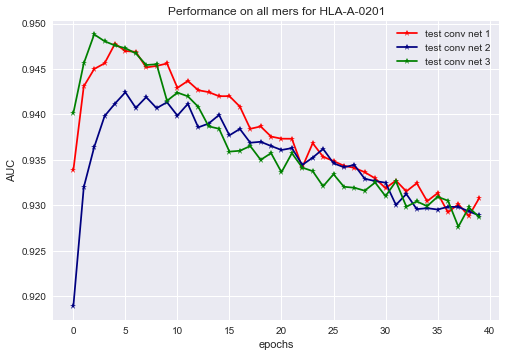

In [18]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[3,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[3,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[3,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="test conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0201")
plt.legend(loc=1)

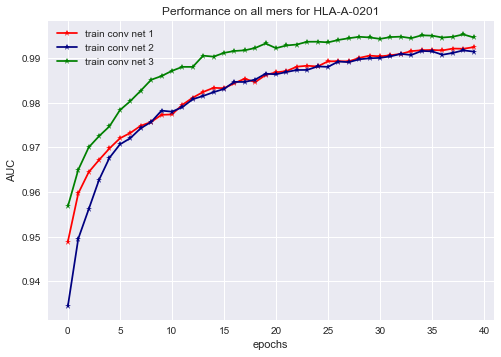

In [19]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[1,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[1,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[1,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0201")
plt.legend(loc=2)

we clearly see that the convolutional filter size increases the model capacity, as the training performance goes up for conv net 3. We now need to add regularization to the model, as we are strongly overfitting. The two classical examples for regularization is weight decay techniques and dropout. However as it seems oftentimes dropout does not work well with convolutional layers (Zeiler et al. 2013: https://arxiv.org/pdf/1301.3557.pdf) and it is suggested to use stochastic pooling instead of dropout. Another potential thing to try is data augmentation techniques such as cropping or flipping. Here the list of things that might potentially work:

    (1) weight decay techniques: W_regulrizer = l2(0.01) or activity_regularizer = acitvity_l2(0.01)
    (2) stochastic pooling, dynamic pooling or other pooling techniques
    (3) data augmentation such as flipping or cropping

# C - adding regularization 

In [22]:
from keras.regularizers import l2, activity_l2

in the following experiment, we denote:

    conv net 1 -> conv net with filter lengths 1,2,4,8 and 'W_regularizer = l2(0.01)' on the conv layers
    conv net 2 -> conv net with filter lengths 1,2,4,8 and 'W_regularizer = l2(0.01)' on the hidden layer
    conv net 3 -> conv net with filter lengths 1,2,4,8 and 'no additional regularization


In [23]:
folds = 3
batch_size_nn = 16
batch_size_lstm = 16
hidden = 50
dropout_probability = 0.25

n_epochs = 40
epoch = 0



conv_net_1_aucs = np.zeros((6, folds,n_epochs))
conv_net_2_aucs = np.zeros((6, folds,n_epochs))
conv_net_3_aucs = np.zeros((6, folds,n_epochs))

for i, (train_idx, test_idx) in enumerate(KFold(len(X),folds, shuffle=True)):
    
    list_index = split_by_length(X,train_idx,length=9)+split_by_length(X,test_idx,length=9)
    
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, W_regularizer = l2(0.01), input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, W_regularizer = l2(0.01), input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, W_regularizer = l2(0.01), input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, W_regularizer = l2(0.01), input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_1 = Model(input = sequence, output = output)
    
    conv_net_1.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, W_regularizer = l2(0.01), init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_2 = Model(input = sequence, output = output)
    
    conv_net_2.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_3 = Model(input = sequence, output = output)
    
    conv_net_3.compile(optimizer = 'adam', loss='mean_squared_error')
    
    
    for epoch in range(n_epochs):
        
        
        conv_net_1.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_1_aucs[k][i][epoch] = AUC_simple(conv_net_1, X, y  , index)    
        
        conv_net_2.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_2_aucs[k][i][epoch] = AUC_simple(conv_net_2, X, y  , index)    
        
        conv_net_3.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_3_aucs[k][i][epoch] = AUC_simple(conv_net_3, X, y  , index)    
            
           
 
    
        
        print("test AUC allmers:", conv_net_1_aucs[3][i][epoch], conv_net_2_aucs[3][i][epoch], conv_net_3_aucs[3][i][epoch], i, epoch)  
        print("test AUC 9 mers:",  conv_net_1_aucs[4][i][epoch], conv_net_2_aucs[4][i][epoch], conv_net_3_aucs[4][i][epoch], i, epoch)  
        print("test AUC non 9 mers:", conv_net_1_aucs[5][i][epoch], conv_net_2_aucs[5][i][epoch], conv_net_3_aucs[5][i][epoch], i, epoch)  

Epoch 1/1
6376/6376 [==============================] - 5s - loss: 0.0669       

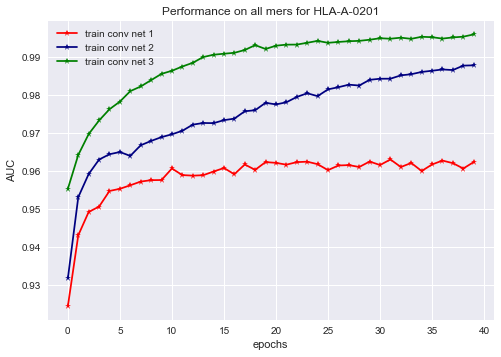

In [24]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[1,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[1,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[1,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0201")
plt.legend(loc=2)

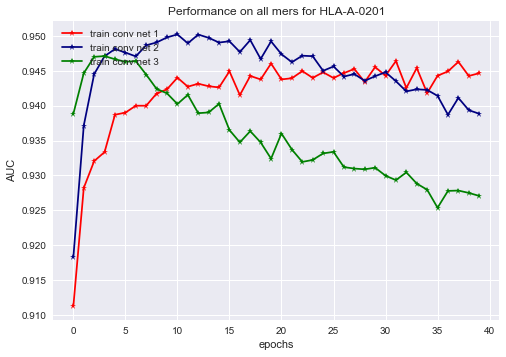

In [25]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[3,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[3,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[3,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0201")
plt.legend(loc=2)

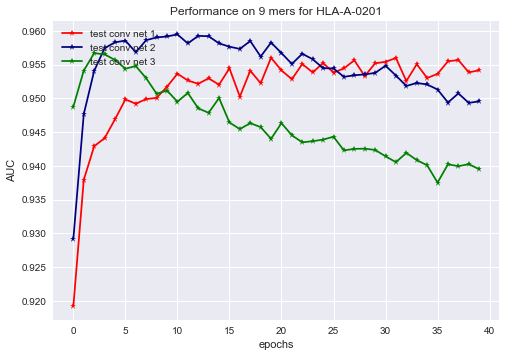

In [27]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[4,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[4,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[4,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="test conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on 9 mers for HLA-A-0201")
plt.legend(loc=2)

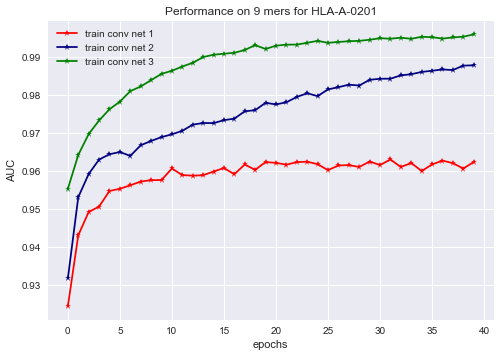

In [29]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[1,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[1,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[1,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on 9 mers for HLA-A-0201")
plt.legend(loc=2)

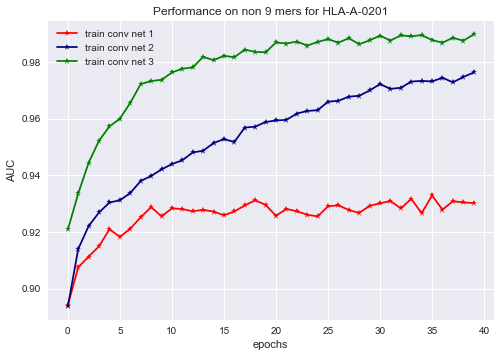

In [30]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[2,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[2,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[2,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on non 9 mers for HLA-A-0201")
plt.legend(loc=2)

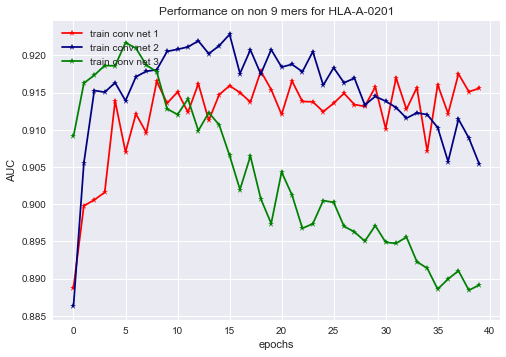

In [31]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[5,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[5,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[5,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")


plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on non 9 mers for HLA-A-0201")
plt.legend(loc=2)

in the following experiment, we denote:

    conv net 1 -> conv net with filter lengths 1,2,4,8 and 'W_regularizer = l2(0.01)' on the hidden layer
    conv net 2 -> conv net with filter lengths 1,2,4,8 and 'W_regularizer = l2(0.1)' on the hidden layer
    conv net 3 -> conv net with filter lengths 1,2,4,8 and 'activity_regularizer = l2(0.01)' on the hidden layer
    conv net 4 -> conv net with filter lengths 1,2,4,8 and 'W_regularizer = l2(0.01)' and 'activity_regularizer = l2(0.01)' on the hidden layer

In [33]:
folds = 3
batch_size_nn = 16
batch_size_lstm = 16
hidden = 50
dropout_probability = 0.25

n_epochs = 40
epoch = 0



conv_net_1_aucs = np.zeros((6, folds,n_epochs))
conv_net_2_aucs = np.zeros((6, folds,n_epochs))
conv_net_3_aucs = np.zeros((6, folds,n_epochs))
conv_net_4_aucs = np.zeros((6, folds,n_epochs))

for i, (train_idx, test_idx) in enumerate(KFold(len(X),folds, shuffle=True)):
    
    list_index = split_by_length(X,train_idx,length=9)+split_by_length(X,test_idx,length=9)
    
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, W_regularizer = l2(0.01), init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_1 = Model(input = sequence, output = output)
    
    conv_net_1.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, W_regularizer = l2(0.1), init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_2 = Model(input = sequence, output = output)
    
    conv_net_2.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, activity_regularizer=activity_l2(0.01), init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_3 = Model(input = sequence, output = output)
    
    conv_net_3.compile(optimizer = 'adam', loss='mean_squared_error')
    
    # CONV NET POOL,FILTER=(3,(1,2,4,8))
    sequence = Input( shape= (26, ),dtype='int32')
    embedded = Embedding(input_dim = 21, input_length = 26, output_dim= 32)(sequence)
    
    z_0 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 1, border_mode='same', activation='relu')(embedded))
    z_1 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 2, border_mode='same', activation='relu')(embedded))
    z_2 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 4, border_mode='same', activation='relu')(embedded))
    z_3 = MaxPooling1D(pool_length=3, stride=None, border_mode='valid')(Convolution1D(nb_filter = 32, input_shape = (26, 32), filter_length = 8, border_mode='same', activation='relu')(embedded))
   

    merged = merge([z_0,z_1,z_2,z_3], mode = 'concat', concat_axis=1)
    flatten = Flatten()(merged)
    hidden = Dense(100, W_regularizer = l2(0.01), activity_regularizer=activity_l2(0.01), init='glorot_uniform', activation='tanh')(flatten)
    after_dp = Dropout(dropout_probability)(hidden)
    output = Dense(1, init='glorot_uniform', activation = 'sigmoid')(after_dp)
    conv_net_4 = Model(input = sequence, output = output)
    
    conv_net_4.compile(optimizer = 'adam', loss='mean_squared_error')
    
    
    for epoch in range(n_epochs):
        
        
        conv_net_1.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_1_aucs[k][i][epoch] = AUC_simple(conv_net_1, X, y  , index)    
        
        conv_net_2.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_2_aucs[k][i][epoch] = AUC_simple(conv_net_2, X, y  , index)    
        
        conv_net_3.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_3_aucs[k][i][epoch] = AUC_simple(conv_net_3, X, y  , index)    
            
        conv_net_4.fit(X[train_idx],y[train_idx], batch_size = 16, nb_epoch = 1)        
        for k, index in enumerate(list_index):
            conv_net_4_aucs[k][i][epoch] = AUC_simple(conv_net_4, X, y  , index)  
 
    
        
        print("test AUC allmers:", conv_net_1_aucs[3][i][epoch], conv_net_2_aucs[3][i][epoch], conv_net_3_aucs[3][i][epoch],conv_net_4_aucs[3][i][epoch], i, epoch)  
        print("test AUC 9 mers:",  conv_net_1_aucs[4][i][epoch], conv_net_2_aucs[4][i][epoch], conv_net_3_aucs[4][i][epoch], conv_net_4_aucs[4][i][epoch], i, epoch)  
        print("test AUC non 9 mers:", conv_net_1_aucs[5][i][epoch], conv_net_2_aucs[5][i][epoch], conv_net_3_aucs[5][i][epoch], conv_net_4_aucs[5][i][epoch],i, epoch)  

Epoch 1/1
6376/6376 [==============================] - 7s - loss: 0.1608        

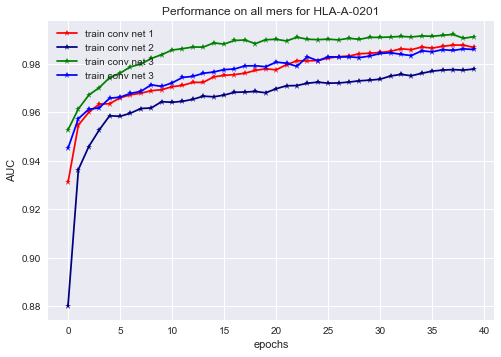

In [34]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[1,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="train conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[1,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="train conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[1,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="train conv net 3")
plt.plot( np.arange(0,n_epochs,1), conv_net_4_aucs[1,:,:n_epochs].mean(axis=0),color='blue',marker='*', linestyle='-', label ="train conv net 3")



plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0201")
plt.legend(loc=2)

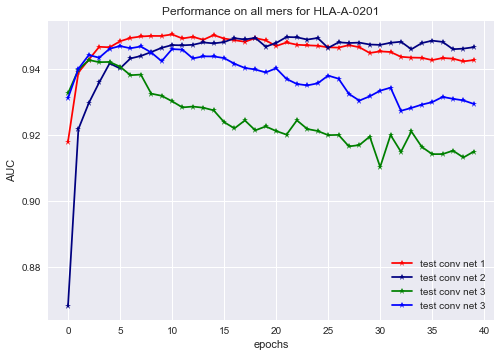

In [37]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[3,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[3,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[3,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="test conv net 3")
plt.plot( np.arange(0,n_epochs,1), conv_net_4_aucs[3,:,:n_epochs].mean(axis=0),color='blue',marker='*', linestyle='-', label ="test conv net 3")



plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on all mers for HLA-A-0201")
plt.legend(loc=4)

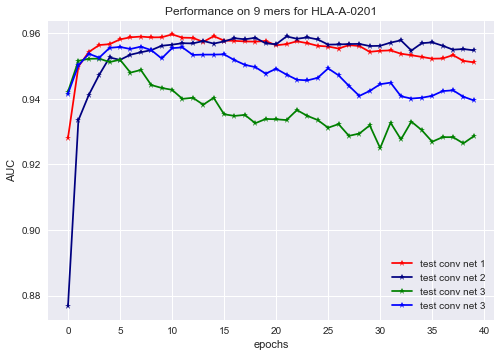

In [38]:
plt.plot( np.arange(0,n_epochs,1), conv_net_1_aucs[4,:,:n_epochs].mean(axis=0),color='r',marker='*', linestyle='-', label ="test conv net 1")
plt.plot( np.arange(0,n_epochs,1), conv_net_2_aucs[4,:,:n_epochs].mean(axis=0),color='navy',marker='*', linestyle='-', label ="test conv net 2")
plt.plot( np.arange(0,n_epochs,1), conv_net_3_aucs[4,:,:n_epochs].mean(axis=0),color='green',marker='*', linestyle='-', label ="test conv net 3")
plt.plot( np.arange(0,n_epochs,1), conv_net_4_aucs[4,:,:n_epochs].mean(axis=0),color='blue',marker='*', linestyle='-', label ="test conv net 3")



plt.xlabel("epochs")
plt.ylabel("AUC")
plt.title ("Performance on 9 mers for HLA-A-0201")
plt.legend(loc=4)